# Intro

This notebook provides a descriptive analysis of behavior and walks through observations that contextualize later analysis. As in the `Data Cleaning` notebook, the emphasis will be on the pushes instead of the continuous variables, like gaze and position.

In [2]:
%matplotlib inline
import logging
import os

import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import numpy as np

from foraging import SEED, MULTIPLOT_FIGSIZE, BIN_WIDTH, WINDOW_SIZE, STEP
from foraging.plotting import bp, embeddable_to_conds, enhanced_violinplot, gifler
from foraging.plotting.behavior import BehaviorPlotter

from foraging.config.experiments import AngelakiPlottingConfig
from foraging.utils.autoreload import setup_auto_reload
from foraging.utils.data import display_df, filter_df, make_angelaki_experiment, angelaki_exclusion_criteria
from foraging.models.experiment import Experiment

# Supress annoying warnings and filter out logs that aren't useful here
import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)
mlogger = logging.getLogger("matplotlib")
mlogger.setLevel(logging.WARNING)

# Set up development tools
setup_auto_reload()
pd.options.mode.copy_on_write = True

# Important filepaths and constants
EXPERIMENT_DIR = "../../data/experiments/angelaki"
ANALYSIS_DIR = "../../data/analysis"
FIGURES_DIR = "../../figures"
RNG = np.random.default_rng(SEED)
TO_HTML = False  # Change this to True when rendering HTML
ZOOM_KWARGS = {  # Convenience settings for zoomed in plots
    "show_traces": True,
    "smooth_kwargs": {"win_type": "gaussian", "window_size": 30, "step": 5},
}
FULL_BLOCK_KWARGS = {
    "min_obs": 10,
    "smooth_kwargs": {"win_type": "gaussian"},
}

✅ Auto-reload extension already loaded!
✅ Auto-reload w/ 2 mode enabled! Changes to all packages will be automatically loaded.


# Table of Contents
- [Load Data](#Load-Data)
  - [Data Overview](#Data-Overview)
- [Explore Data](#Explore-Data)
  - [Example Block](#Example-Block)
  - [Pushes](#Pushes)
    - [Runlengths](#Runlengths)
    - [Accuracy](#Accuracy)
    - [Surprise](#Surprise)
    - [Staying vs Switching](#Staying-vs-Switching)
  - [Block Dynamics](#Block-Dynamics)
    - [Push Rate](#Push-Rate)
    - [Push Intervals](#Push-Intervals)
    - [Reward Rate](#Reward-Rate)
    - [Reward-Per-Push](#Reward-Per-Push)
  - [Matching Law](#Matching-Law)
- [Conclusion](#Conclusion)

# Load Data

The experiment data consists of multiple matfiles corresponding to the data for different subjects. Each matfile contains that subject's push, eye tracking (if available), and position (if available) data organized by blocks and sessions. Each block corresponds to a set of experiment parameters, notably the schedule of each box, the stimulus reliability kappa, and the stimulus type. A hierarchical overview of a given matfile is as follows:

+--- subject\
&nbsp;&nbsp;&nbsp;&nbsp; |___ session\
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; |___ block (kappa, stimulus type, schedules)\
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; |___ push times\
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; |___ reward outcomes\
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; |___ push times

For human data, each session is a subject. Unless otherwise noted, subjects underwent multiple sessions, one session per day, and each contain multiple blocks with different experiment parameters per block.
Refer to `docs\info.docx` for more details.

Here is a DataFrame showing a subset of the data. Refer to the docstring of `make_df` for more information about the contents of the DataFrame.

In [3]:
%%capture --no-display
dataset = make_angelaki_experiment(EXPERIMENT_DIR)
dataset = angelaki_exclusion_criteria(dataset, EXPERIMENT_DIR)
plotter = BehaviorPlotter(dataset, AngelakiPlottingConfig().to_dict())
df = dataset.df
display_df(df, ["subject", "session", "block", "box", "push times", "reward outcomes"])

| subject | session | block | box | push times | reward outcomes |
| --- | --- | --- | --- | --- | --- |
| dylan | 20211206 | 2 | slow | 3.1349999997764826 | False |
| dylan | 20211206 | 2 | fast | 8.464999999850988 | False |
| dylan | 20211206 | 2 | fast | 9.467999999877065 | False |
| dylan | 20211206 | 2 | fast | 11.666999999899417 | False |
| dylan | 20211206 | 2 | medium | 17.125 | False |

## Data Overview
A quick overview of the summary statistics:

In [3]:
print("schedules experienced by each subject")
print(df.groupby("subject")["schedule"].unique())

schedules experienced by each subject
subject
dylan                                  [35.0, 15.0, 21.0]
humans                                  [14.0, 21.0, 7.0]
marco                            [35.0, 15.0, 21.0, 30.0]
viktor    [15.0, 21.0, 35.0, 28.0, 7.0, 14.0, 20.0, 80.0]
Name: schedule, dtype: object


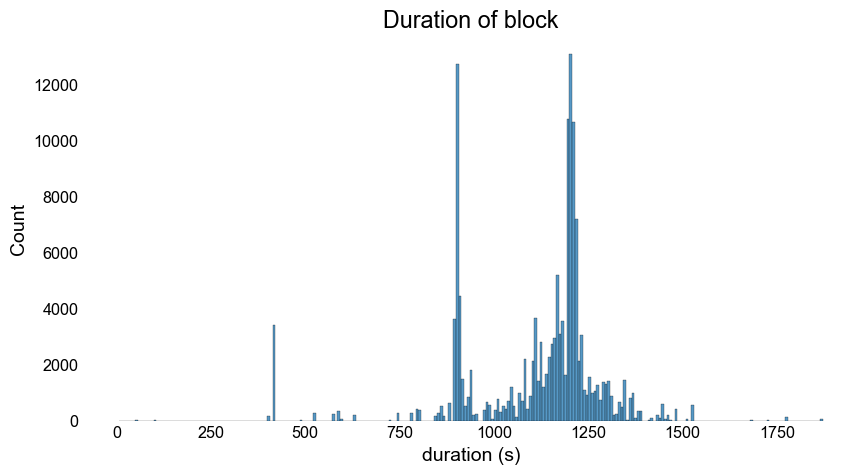

In [4]:
sns.histplot(df, x="duration")
plt.title("Duration of block")
plt.xlabel("duration (s)");

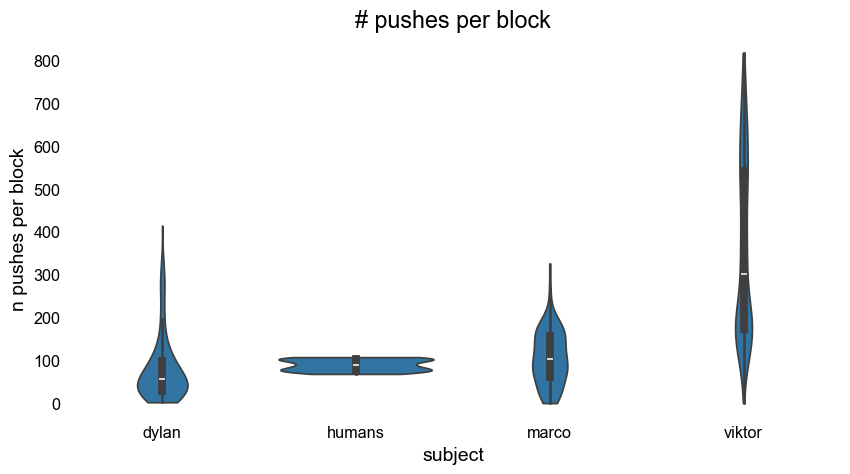

In [5]:
block_summary = (
    df.groupby(["subject", "session", "block"])
    .size()
    .reset_index(name="n pushes per block")
)
sns.violinplot(block_summary, x="subject", y="n pushes per block", cut=0)
plt.title("# pushes per block");

Here is a bird's eye view of one subject's behavioral data over the course of the entire experiment. Each row is a session of consecutive blocks. Each block's pushes are displayed as a raster plot over the duration of that block, and the pushes at each box position are stacked on top of each other (top to bottom is 3, 2, 1). Finally, pushes are colored by box schedule, so we can see how the schedules are assigned to each box over consecutive blocks.

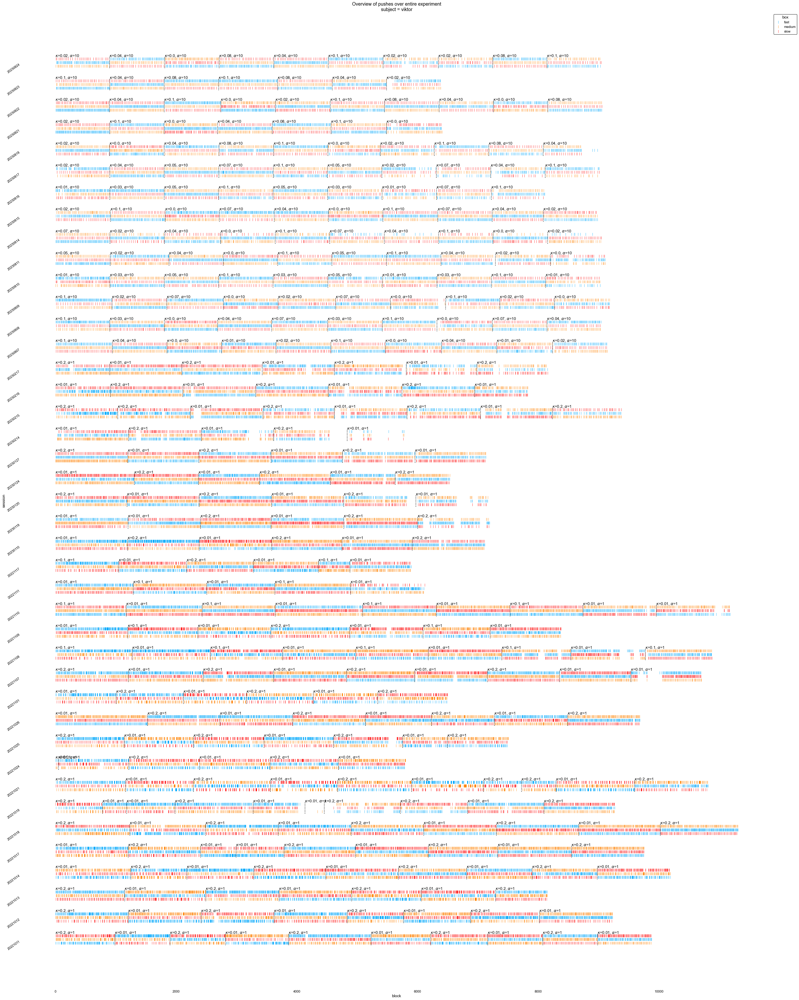

In [6]:
conds = dict(subject="viktor")
plotter.plot_experiment_overview(
    conds=conds,
    annotate_block=[r"$\kappa$", r"$\alpha$"],
    fig_kwargs=dict(figsize=(40, 50)),
);

# Explore Data
The behavioral quantities we will explore are: push intervals, consecutive push intervals, stay pushes, switch pushes, runlengths of consecutive choices, etc. These are defined as follows:
+ <span style='color:#03a9fc'>push intervals</span>: time between pushes *at the same box*, which can include pushes made at other boxes during this interval. This is essentially how long the subject has been waiting on this box to be ready before they push at that box again. Depending on context, this is interchangeable with push times (for example, if discussing push times in a block, then this should be interpreted as the absolute time the push occurred in the block, not the time between pushes. On the other hand, push times for an individual choice the subject made should be interpreted as the push interval). Unless otherwise noted, this is the default meaning for push intervals.
+ <span style='color:#fa5cbe'>consecutive push intervals</span>: time between *consecutive* pushes-- unlike general push intervals, this can include the time between pushes at different boxes.
+ <span style='color:#fa0c9f'>stay times/stay pushes</span>: the intersection of consecutive push intervals and general push intervals, which occurs when the subject chooses to stay at their current box and push again.
+ <span style='color:#22c793'>switch times/switch pushes</span>: the time between consecutive pushes at different boxes, which may potentially largely capture travel time between equidistant boxes.
+ <span style='color:#ff9d00'>runlengths</span>: the number of times the subject pushes the same box before switching boxes.

One hypothesis we would like to test is whether the subjects' push intervals obey the matching law, which is a normative principle that states that how often an option is picked is proportional to the reward they give. For example, a box with a faster schedule should be visited more frequently than a slower box. A good discussion of when matching is the result of theoretically optimal decision-making can be found in [(Sakai & Fukai 2008)](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0003795). In our study, the matching law should materialize as the reward rates being proportional to the visit frequencies of each box; since each box has a different schedule, then, in expectation, the push times for a given box should be proportional to the schedules of that box.

## Example Block

Here we show activity in an example block unfolding over time. Blue = fast box, yellow = medium box, red = slow box. Filled markers indicate rewarded pushes, unfilled unrewarded.

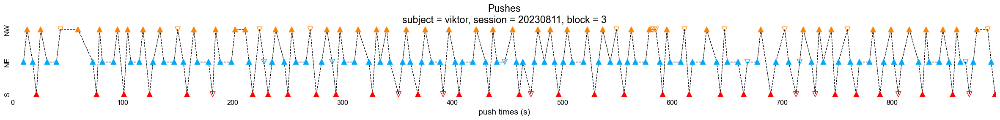

In [7]:
plotter.plot_pushes(conds = dict(subject="viktor", session=20230811, block=3), fig_kwargs=dict(figsize=(30, 2.2)), legend=False);

## Pushes

Here is an overview of the statistics of the pushes for each subject.

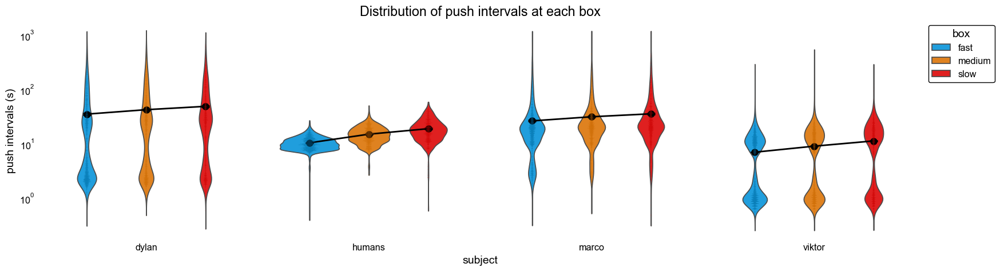

In [8]:
fig, ax = plt.subplots(figsize=MULTIPLOT_FIGSIZE)
bp(sns.swarmplot)(
    df.groupby("subject").sample(10000, random_state=SEED, replace=True),
    x="subject",
    y="push intervals",
    hue="box",
    palette=plotter.get_config_value("palette_dark"),
    legend=False,
    log_scale=True,
    size=0.25,
    dodge=True,
    ax=ax,
)

bp(enhanced_violinplot)(
    df,
    x="subject",
    y="push intervals",
    hue="box",
    palette=plotter.get_config_value("palette"),
    title="Distribution of push intervals at each box",
    y_unit="s",
    cut=0,
    inner=None,
    log_scale=True,
    common_norm=True,
    ax=ax,
);

There is a bimodality present in a couple subjects. Below, we split the data into the exponential schedule and gamma schedule.

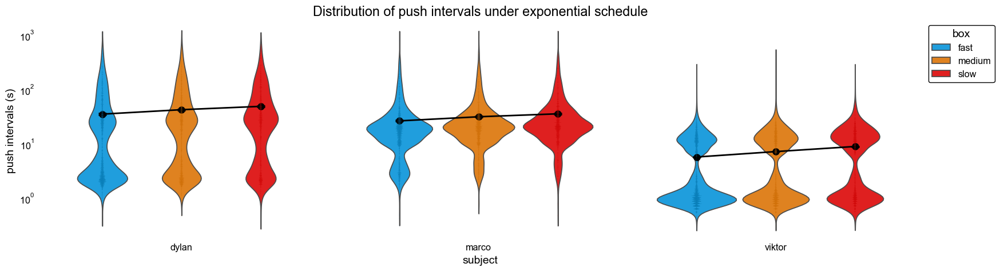

In [9]:
fig, ax = plt.subplots(figsize=MULTIPLOT_FIGSIZE)
bp(sns.swarmplot)(
    df.xs(1, level="shape")
    .groupby("subject")
    .sample(10000, random_state=SEED, replace=True),
    x="subject",
    y="push intervals",
    hue="box",
    palette=plotter.get_config_value("palette_dark"),
    legend=False,
    log_scale=True,
    size=0.25,
    dodge=True,
    ax=ax,
)
bp(enhanced_violinplot)(
    df.xs(1, level="shape"),
    x="subject",
    y="push intervals",
    hue="box",
    palette=plotter.get_config_value("palette"),
    title="Distribution of push intervals under exponential schedule",
    y_unit="s",
    cut=0,
    inner=None,
    log_scale=True,
    common_norm=True,
    ax=ax,
);

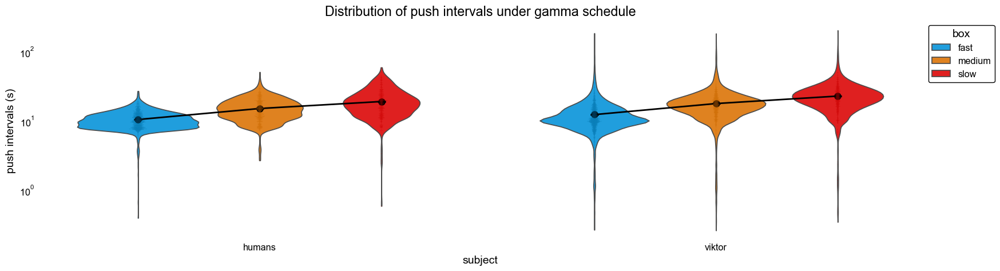

In [10]:
fig, ax = plt.subplots(figsize=MULTIPLOT_FIGSIZE)
bp(sns.swarmplot)(
    df.xs(10, level="shape")
    .groupby("subject")
    .sample(10000, random_state=SEED, replace=True),
    x="subject",
    y="push intervals",
    hue="box",
    palette=plotter.get_config_value("palette_dark"),
    legend=False,
    log_scale=True,
    size=0.25,
    dodge=True,
    ax=ax,
)
bp(enhanced_violinplot)(
    df.xs(10, level="shape"),
    x="subject",
    y="push intervals",
    hue="box",
    palette=plotter.get_config_value("palette"),
    title="Distribution of push intervals under gamma schedule",
    y_unit="s",
    cut=0,
    inner=None,
    log_scale=True,
    common_norm=True,
    ax=ax,
);

It's clear the bimodality results from some property of the exponential schedule. To confirm this and see if there are any other trends that emerge throughout the experiment, we'll next show the distribution of push intervals in each session. Since humans do not have session data, they are omitted for now.

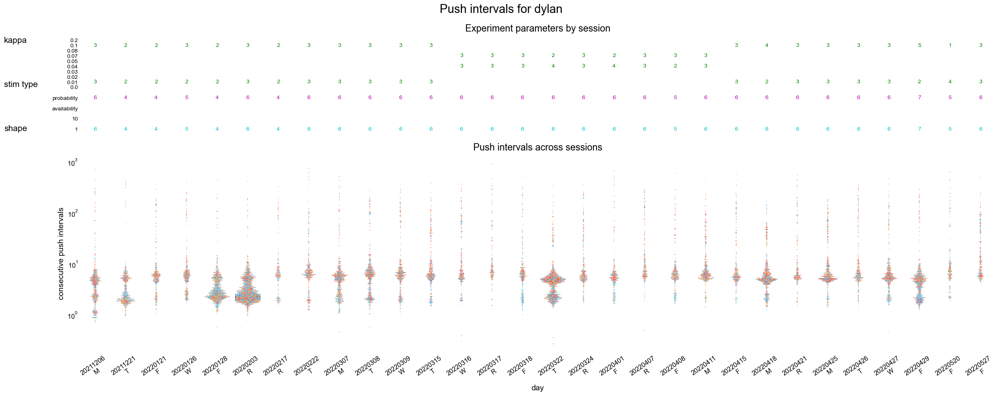

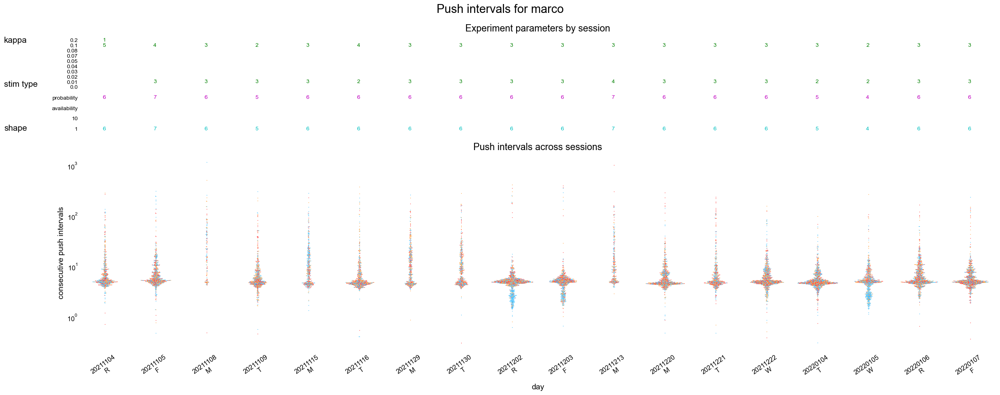

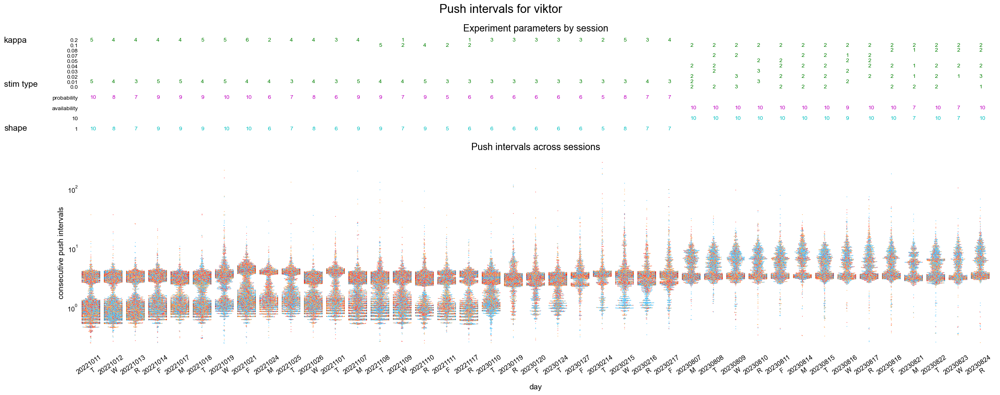

In [11]:
%%capture --no-display
plotter.plot_push_intervals_by_sessions();

These swarmplots are useful for visualizing individual data points by jittering the ones that collide, to the limit that the data points aren't too cluttered and impede comprehension. The x-axis denotes days since the first session (with day 0 corresponding to the first session) and the y-axis are the log push intervals in each session. For Dylan and Marco, the number of data points is manageable but for Viktor they are so numerous that you can see where the plot struggles to fit all the data points. Each swarmplot is preceded by an experiment overview where, for each session, we denote how many blocks had a certain parameter value, which gives us a sense of the timeline for how the experiment evolved and when decisions were made to change the experiment. The x-axes for a swarmplot and its corresponding experiment overview are aligned for ease of comparison.

One thing to look for are sessions that look distributionally different from the others, e.g. day 0 for Dylan shows a bump around extremely fast push intervals around 1 second, and days 53-59 contain a big bump of pushes right above 1 second. For Marco, day 4 is extremely scarce in pushes compared to other days. It's interesting to see heterogeneous patterns in the pushes, in particular for Viktor. In fact, we see three distinct patterns of clusters organized in time: days 0-91 exhibit strong bimodality, days 100-129 are more unimodal and concentrate towards larger push intervals, and days 300-317 concentrate on even larger push intervals. Notice that day 300 coincides with a change in the experiment from the exponential schedule to gamma schedule.

Since the exponential schedule depicts atypical behavior, this notebook will henceforth be dedicated to the gamma schedule and a supplementary notebook will focus on the exponential schedule.

In [12]:
df = filter_df(df, {"shape": 10})
viktor_index = filter_df(df[df["push times"] <= 900], {"subject": "viktor"}).index
human_index = filter_df(df[df["push times"] <= 400], {"subject": "humans"}).index
df = df.loc[viktor_index.append(human_index)]
plotter.dataset = dataset = dataset.wrap(df)

Here are the distributions of push intervals at each box as a function of stimulus reliability.

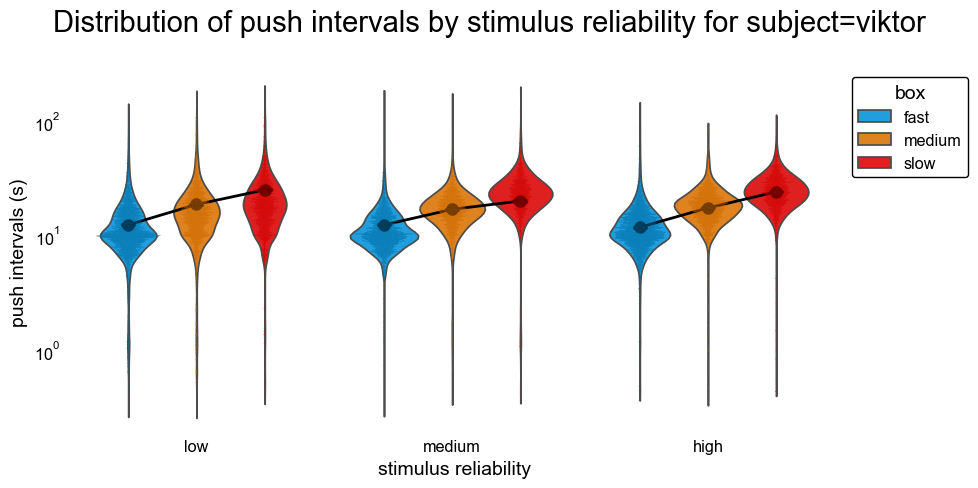

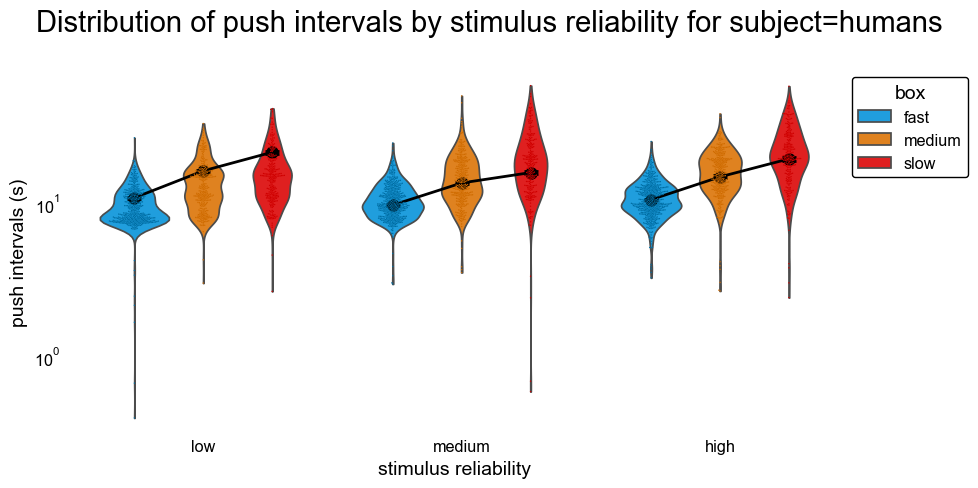

In [13]:
plotter.plot_conditions_by_subject(plotter.plot_push_intervals, fig_title = "Distribution of push intervals by stimulus reliability", cond_kwargs = {'humans': dict(swarm_kwargs={'size': 1})});

The distributions are very similar across stimulus reliabilities, suggesting subjects are able to differentiate the boxes to a similar degree regardless of task difficulty. The distributions seem to grow slightly sharper as reliability increases.

Next, we show the distribution of consecutive push intervals between all pairs of boxes simultaneously, similar to a transition matrix where the rows are the boxes the subject first pushes and the columns are where they push next.

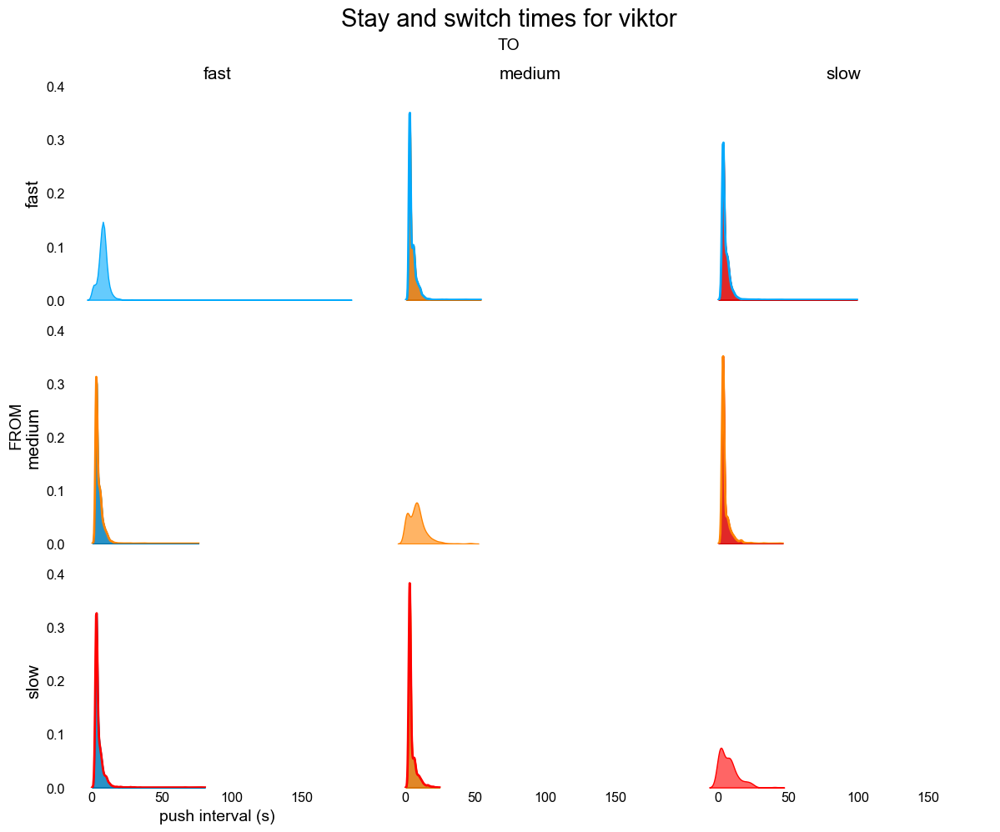

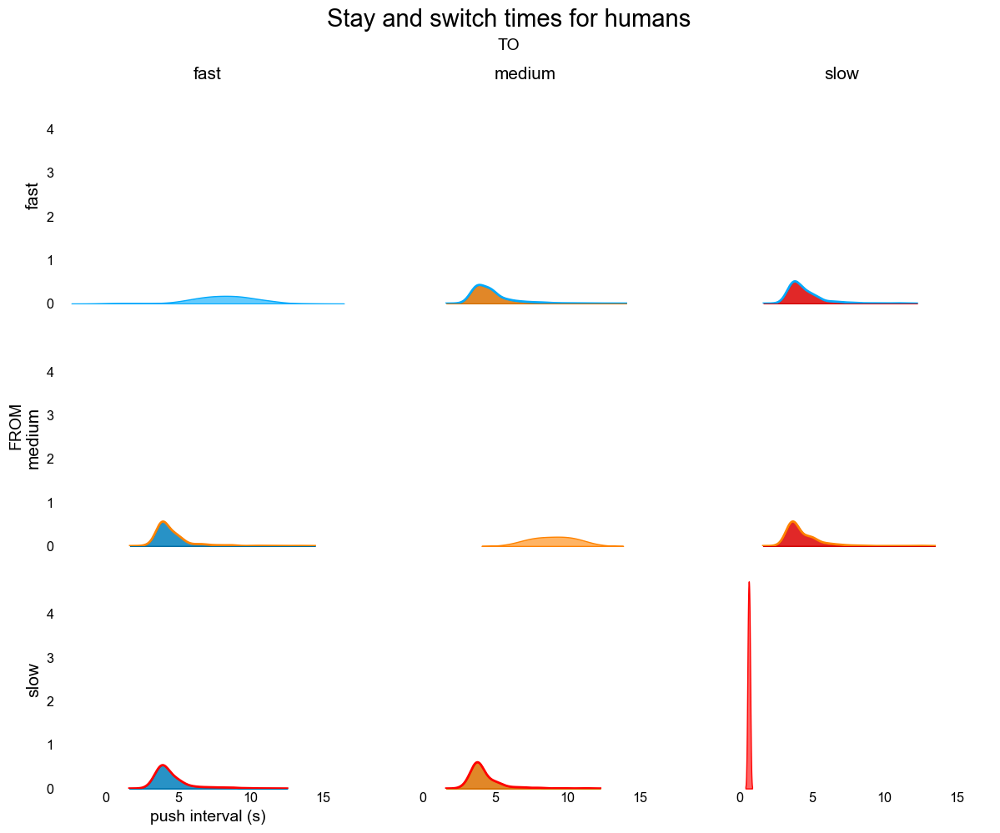

In [14]:
plotter.plot_stay_switch_pushes();

First, the switch times are qualitatively similar across all pairs of boxes. Second, the stay times across all boxes share bimodal features covering about the same range, but the fast box looks qualitatively different from the other boxes.

Finally, the distribution of consecutive push intervals can reveal the complexity of the decision process-- for example, suppose the decision process can be modeled as a simple Markov jump process, where the decision state is merely {push at box $_i$ }. Then, this would result in exponentially distributed intervals between pushes. Fitting an exponential distribution to each empirical distribution via maximum likelihood estimation and then performing a Kolmogorov-Smirnoff test under the null hypothesis that the data is drawn from the fitted exponential distributions resulted in rejecting the null hypothesis in each case, so the push intervals are likely the result of a much more complicated decision process.


### Runlengths
To get a sense of the statistics of *sequences* of pushes, we can gather the runlengths, that is the number of consecutive pushes at the same box before the subject switches.

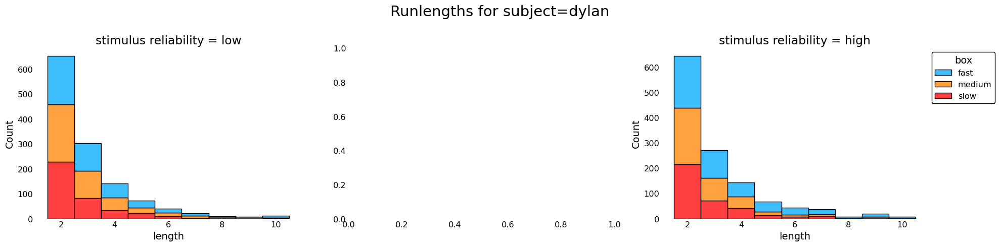

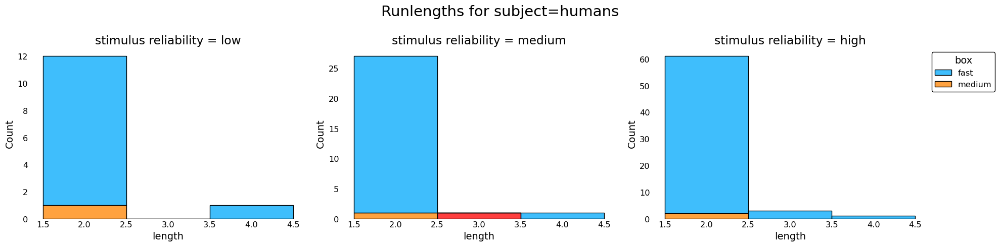

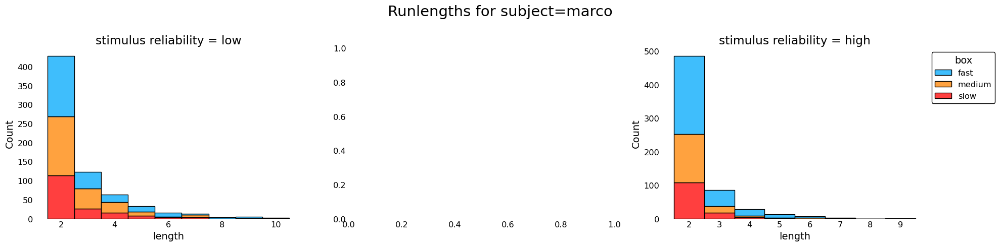

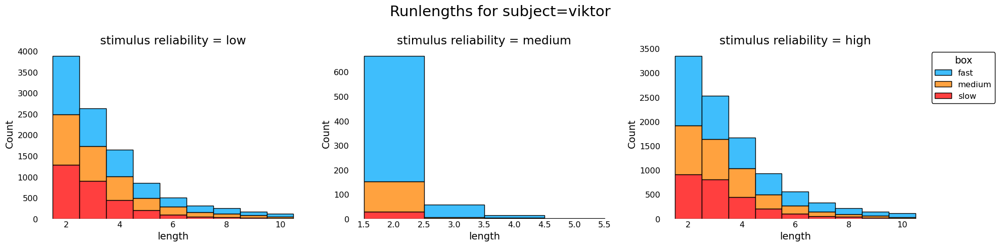

In [4]:
plotter.plot_conditions_by_subject(plotter.plot_runlengths, col_condition = 'stimulus reliability', fig_title='Runlengths');

Subjects fit in more pushes at the fast box before switching.

### Accuracy

Here, we show each push interval along with the corresponding reward interval of the box that was pushed. Basically, we want to see how accurately the subjects timed their pushes to the reward interval of the box-- if they push before the reward interval is up, then they miss the reward, but if they push after the reward interval, then they get the reward. Our expectation is that as the stimulus reliability increases, the subjects should be able to time their pushes more reliably to occur after the reward interval has elapsed.

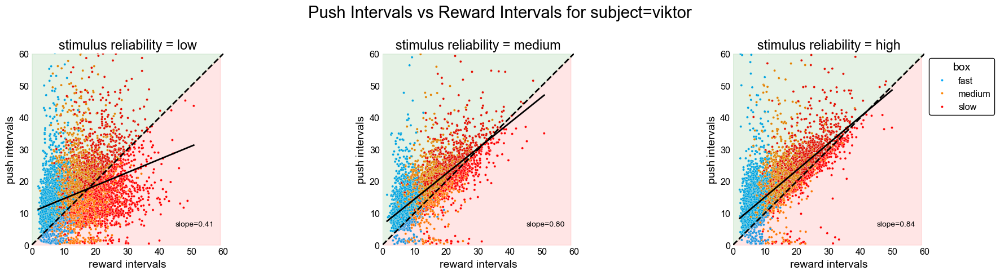

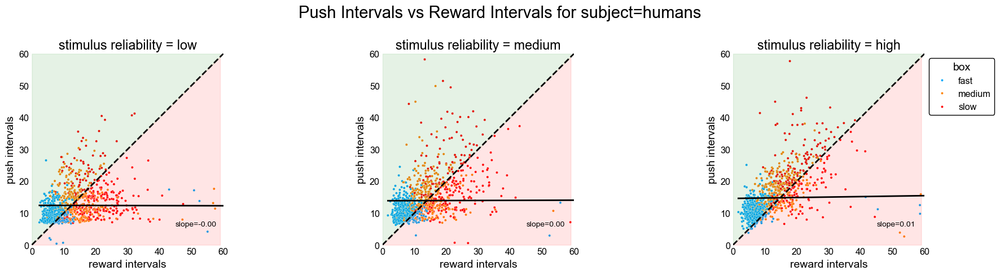

In [16]:
plotter.plot_conditions_by_subject(plotter.plot_push_intervals_vs_reward_intervals, col_condition = 'stimulus reliability', fig_title='Push Intervals vs Reward Intervals', annotate_reg = True);

As expected, the correlation and slope between the push intervals and reward intervals increases with stimulus reliability. We can further decompose the pushes into stay pushes and switch pushes.

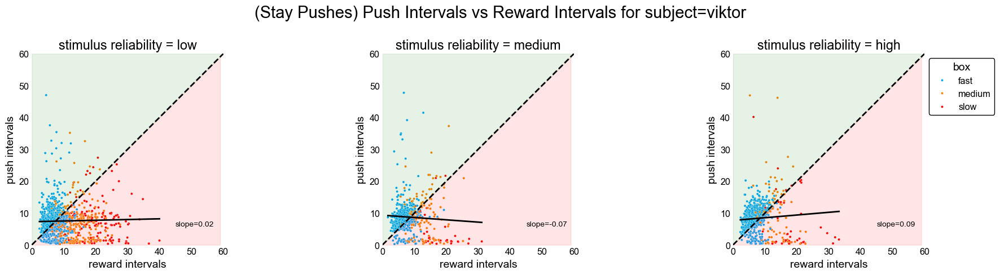

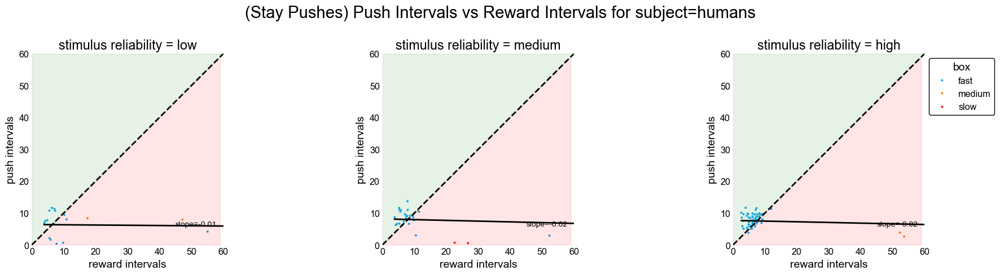

In [17]:
plotter.plot_conditions_by_subject(plotter.plot_push_intervals_vs_reward_intervals, dataset = dataset.filter({"stay/switch": "stay"}), col_condition = 'stimulus reliability', fig_title='(Stay Pushes) Push Intervals vs Reward Intervals', annotate_reg = True);

Most of the stay pushes occur at the fast box, and they explain the cluster of inaccurate pushes that occur at the bottom of the earlier figure.

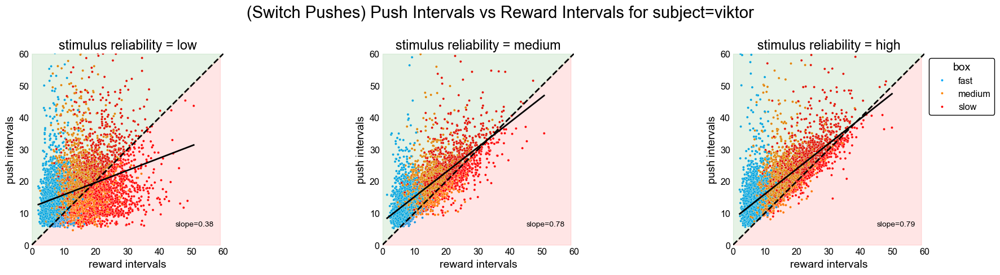

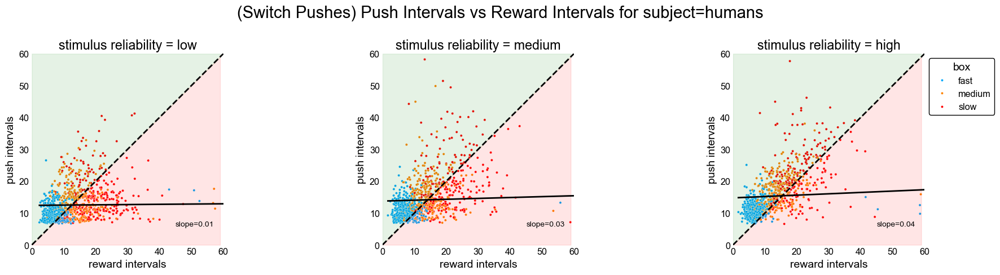

In [18]:
plotter.plot_conditions_by_subject(plotter.plot_push_intervals_vs_reward_intervals, dataset = dataset.filter({"stay/switch": "switch"}), col_condition = 'stimulus reliability', fig_title='(Switch Pushes) Push Intervals vs Reward Intervals', annotate_reg = True);

The majority of pushes are switch pushes, including the cluster of longer pushes.

### Surprise

We can ask how much the factor of "surprise" at a particular reward outcome influences future behavior. For example, if the subject waits a long time and still doesn't get reward, they might 1) switch boxes and 2) wait longer to push the box they left if they start to believe it's a slower box. On the other hand, the behavior of an impatient subject who tends to spam pushes serially at the same box will manifest as a string of stay pushes straddling the y = -x line because y (change in push interval) + x (current push interval) = future push interval. Due to causality (future push can't come before current push), this line also marks the lower boundary of possible points.

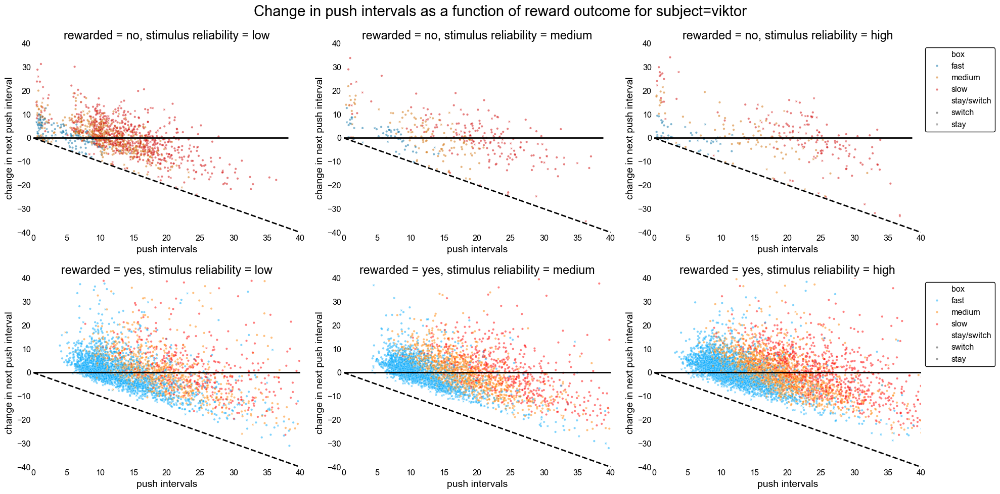

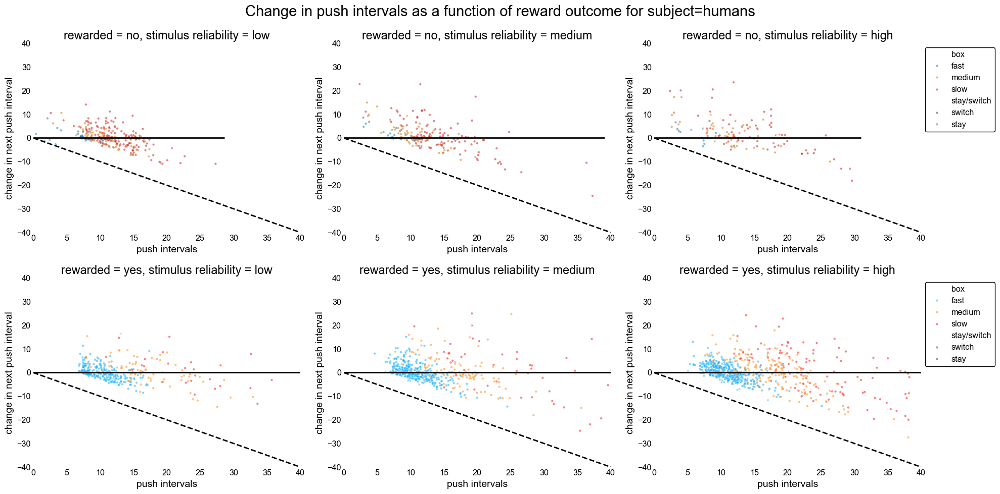

In [ ]:
df["rewarded"] = df["reward outcomes"].map({True: "yes", False: "no"})
plotter.plot_conditions_by_subject(plotter.plot_next_push_surprise, col_condition = 'stimulus reliability', aux_condition = 'rewarded', fig_title='Change in push intervals as a function of reward outcome', legend_kwargs=dict(title=None), fig_kwargs = dict(figsize=(20,10)), s=10);

Across both rewarded and unrewarded cases, there is a transition point at 20-25 s between waiting longer and going sooner the next push that is roughly preserved across all conditions. As reliability increases, the push intervals on the x-axis cluster by boxes. There is a distinct string of stay pushes that occur near the bottom of the graph where the subject pushes a few seconds after the current push. Visually, it appears that the subject switches a lot more across both reward outcomes, possibly switching more the longer they've waited, but when choosing to stay and push again, does so more after being rewarded. We confirm this below by counting how many times they stay or switch depending on how long they waited to push and the reward outcome.

### Staying vs switching

Here we calculate the probability of staying and pushing the same box again as a function of push interval. We do this separately for the rewarded and unrewarded case.

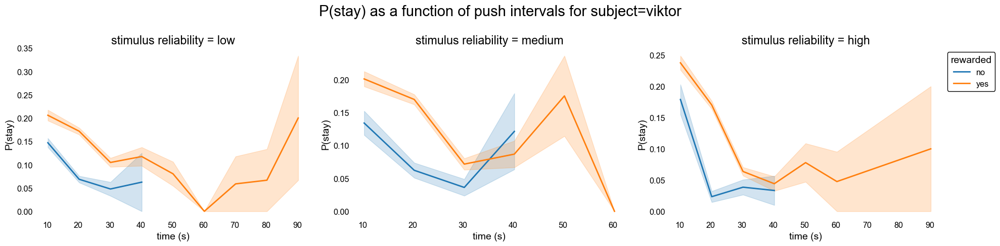

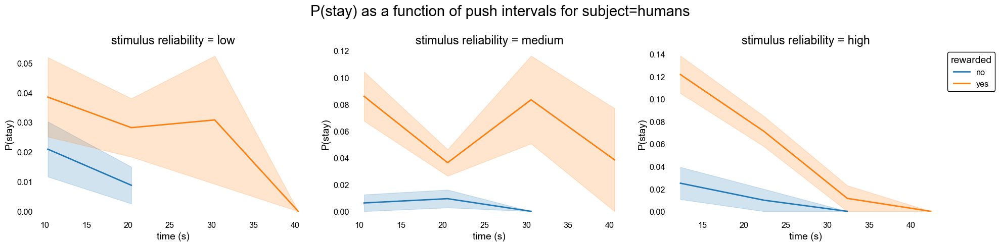

In [20]:
plotter.plot_conditions_by_subject(plotter.plot_stay_probabilities, col_condition = 'stimulus reliability', fig_title='P(stay) as a function of push intervals', min_obs=10);

Clearly, the probability of staying is greater after receiving reward, but it generally goes down the longer the subject waits, with the exception of some weird quirks that could be due to low data volume.

## Block Dynamics

In this section, we explore how behavioral variables, such as reward rate and push frequency, evolve over time in the block. We will also compare to the optimal reward rate possible, if the subject were able to get each reward as soon as it became available. This is equal to the inverse of the schedules, and under negligible travel costs, the sum of their individual reward rates yields the maximum total reward rate.

First, we'll examine the block initiation times to get a good sense of the right bin size for binning push times.

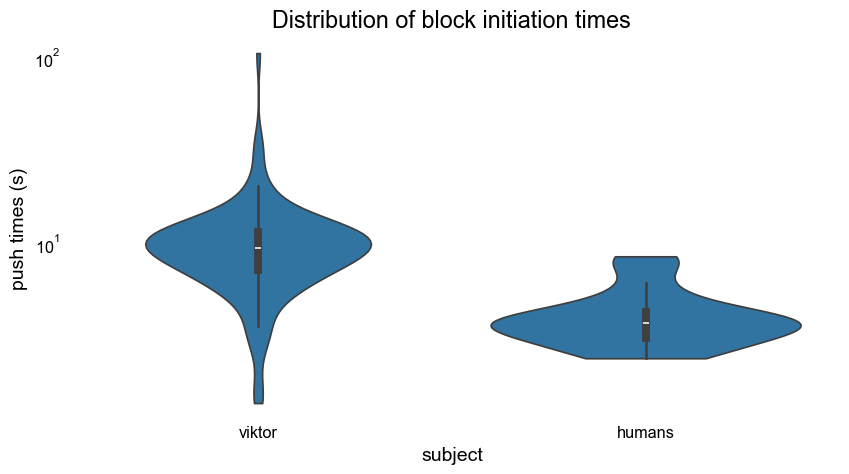

In [21]:
df_init = df.xs(1, level="push #")
bp(sns.violinplot)(
    df_init,
    x="subject",
    y="push times",
    cut=0,
    log_scale=True,
    title="Distribution of block initiation times",
    y_unit="s",
    legend=False,
);

Looks like a bin size of 20-30 seconds should be big enough to prevent accidentally creating artifical transients in the first bin of each block. If we make the bin size too small, then we will be capturing trivial failures in the beginning of the block that aren't really reflective of anything important.

### Push Rate

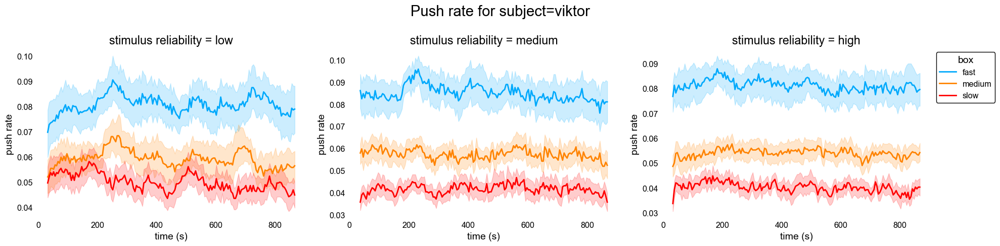

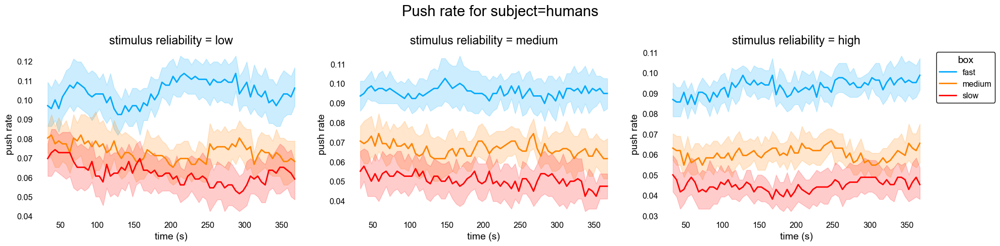

In [22]:
plotter.plot_conditions_by_subject(plotter.plot_push_rates_across_block, col_condition = 'stimulus reliability', fig_title='Push rate', by_box = True);

When the stimulus reliability is low, the subjects initially struggle to distinguish the boxes. As time goes on in the block, they learn.

### Reward Rate

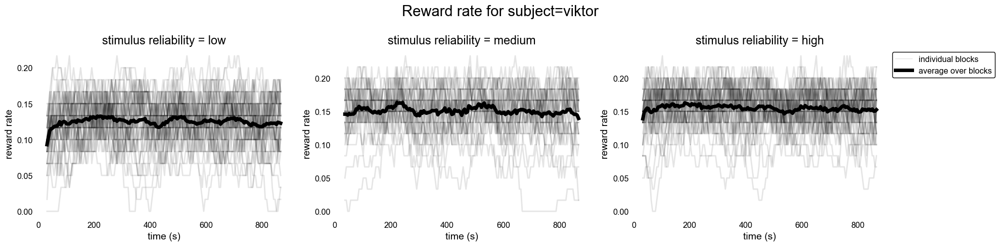

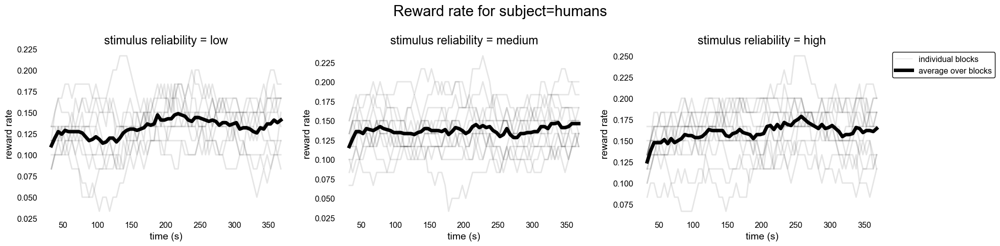

In [23]:
plotter.plot_conditions_by_subject(plotter.plot_reward_rates_across_block, col_condition = 'stimulus reliability', fig_title='Reward rate', show_traces = True);

Reward rate increases as subjects gain more experience in the block. As reliablity increases, the total reward rate combined across all boxes also increases. Next, we decompose the reward rate into different boxes.

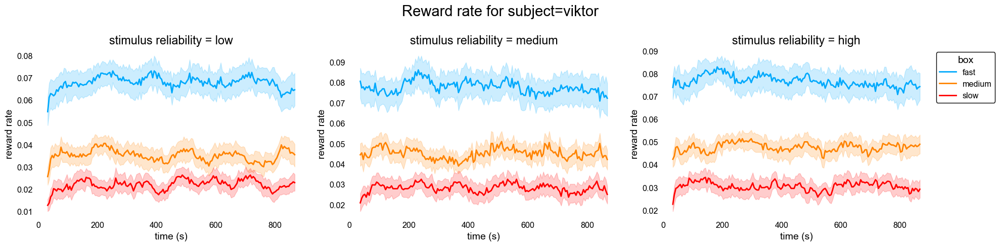

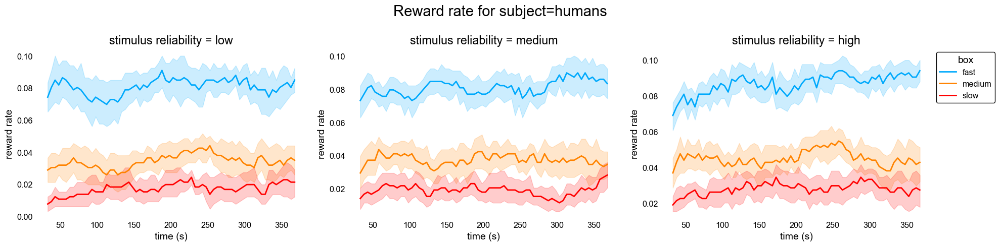

In [24]:
plotter.plot_conditions_by_subject(plotter.plot_reward_rates_across_block, col_condition = 'stimulus reliability', fig_title='Reward rate', by_box = True);

Clearly, the reward rates are ordered the way we would expect them, fast > medium > slow.

### Push Intervals

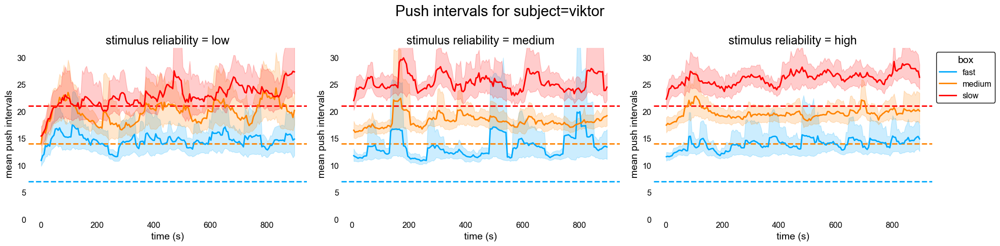

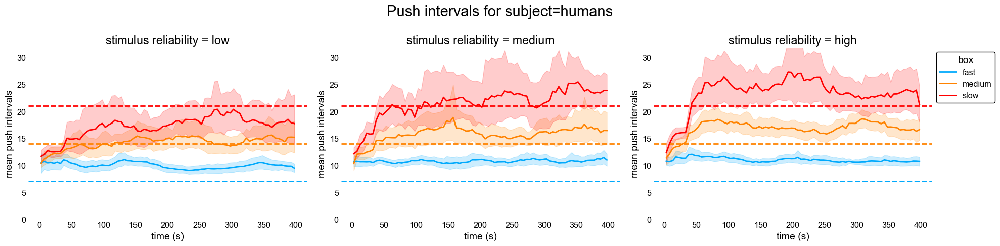

In [25]:
def _auxiliary_plot(
    ds: Experiment,
    conds: dict = None,
    palette: dict = None,
    ax: plt.Axes = None,
    **kwargs,
):
    schedules = sorted(list(ds.get_unique("assigned schedules")[0]))
    boxes = ds.constants.BOX_LABELS
    for box, schedule in zip(boxes, schedules):
        ax.axhline(schedule, color=palette[box], linestyle="--")
    ax.set_ylim(0, ax.get_ylim()[1] + 10)

plotter.plot_conditions_by_subject(plotter.plot_quantity_across_block, col_condition = 'stimulus reliability', x = "push times", y = "push intervals", fig_title='Push intervals', auxiliary_plot = _auxiliary_plot, min_obs = 10, by_box = True, smooth_kwargs=dict(
        fill_value=np.nan,
        min_periods=1,
    )
);

When reliability is low, the push intervals are similar across boxes and differentiation occurs slowly compared to higher reliabilities. When reliability is high, pushes are largely driven by the color cue, so the pushes distinguish the boxes early in the block. Next, we will see how this translates to reward-per-push by counting the fraction of rewarded pushes in each time bin across blocks.

### Reward-per-push

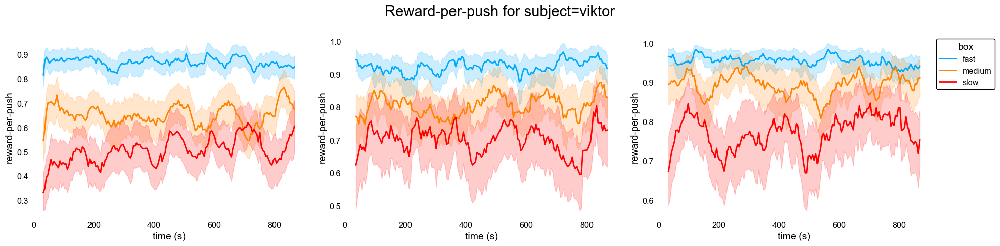

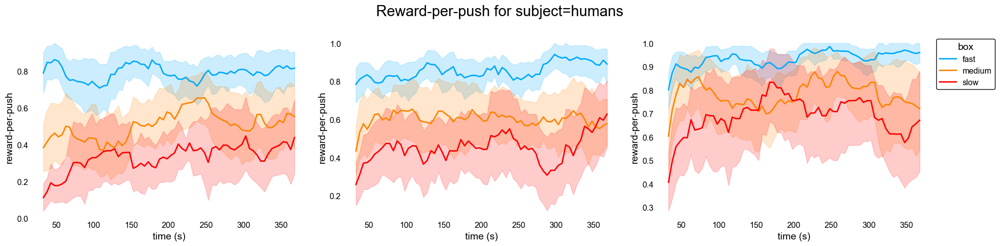

In [26]:
plotter.plot_conditions_by_subject(plotter.plot_reward_per_push_across_block, col_condition = 'stimulus reliability', fig_title='Reward-per-push', by_box = True, min_obs = 10);

The reward-per-push starts off low but increase over time in the block. As reliability increases, they start off higher.

## Matching Law

The matching law is a behavioral principle that states that the number of times an option is picked should be proportional to how much reward is received at that option. For example, if option A gives twice as much reward as option B, then one should pick option A twice as much as they do option B. Formally:

$$ \frac{C_i}{\sum_i C_i} \propto \frac{R_i}{\sum_i R_i}$$

where $C_i$ and $R_i$ denote the number of times option $i$ has been chosen and reward obtained from that option, respectively. The constant of proportionality captures how sensitive the subjects are to the relative reward rates-- if the subject does not perceive much difference between the options, then the constant of proportionality will be less than 1 and the subject will be said to be "undermatching". When the constant of proportionality is greater than 1, then the subject is "overmatching". In the literature, undermatching is more common than overmatching, and also subjects have been observed to have a baseline response rate, or bias that cannot be attributed to reward. This bias and sensitivity to reward rates can be captured by linearly regressing the relative response rates on the relative reward rates, which is what we do below for each block with slopes and intercepts aggregated across blocks.

*Note, the matching law may appear for seemingly trivial behavior. Imagine a subject that waits long enough to push each box at a fixed push interval, then their relative reward will largely be driven by their relative push rate, resulting in close to perfect matching. In the supplementary notebook for the exponential schedule, we observe exactly this scenario.

GIF saved to: animation.gif



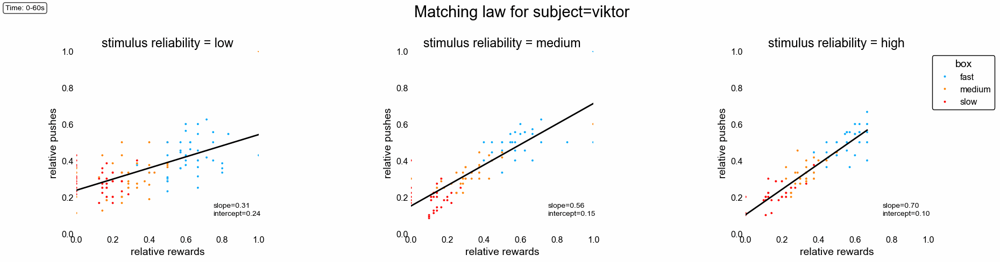

In [29]:
time_bins = list(zip(np.arange(0, 600, 60), np.arange(0, 600, 60) + 60)) 
func = lambda time_bin: plotter.plot_conditions_by_subject(plotter.plot_matching_law, dataset = plotter.dataset.filter({"subject": "viktor"}), col_condition = 'stimulus reliability', fig_title = "Matching law", time_bin = time_bin);
gifler(time_bins, func);

GIF saved to: animation.gif



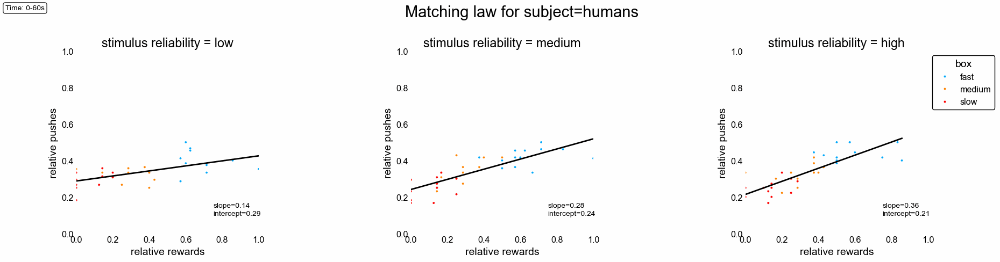

In [ ]:
time_bins = list(zip(np.arange(0, 300, 60), np.arange(0, 300, 60) + 60))
func = lambda time_bin: plotter.plot_conditions_by_subject(plotter.plot_matching_law, dataset = plotter.dataset.filter({"subject": "humans"}), col_condition = 'stimulus reliability', fig_title = "Matching law", time_bin = time_bin);
gifler(time_bins, func);

Across all subjects, there is undermatching as indicated by slopes < 1 and bias that improves with reliability.


# Conclusion

To summarize:
+ Subjects become more accurate as reliability increases
+ Subjects tend to "figure out" the fast box faster than the slower boxes
+ Initially in the block, reward rates across boxes are low but increase and differentiate with experience in the block
+ Undermatching and bias improve with reliability